# Inputs

In [1]:
import os
import pandas as pd
import yaml
import torch
from warnings import filterwarnings
filterwarnings("ignore")

In [2]:
CONFIG_PATH = "configs/uc_infeksi_chron_tb"

In [3]:
DATASET_PARAMS = yaml.load(open(os.path.join(CONFIG_PATH, "dataset.yaml")), Loader=yaml.SafeLoader)
PREPROCESSING_PARAMS = yaml.load(open(os.path.join(CONFIG_PATH, "preprocessing.yaml")), Loader=yaml.SafeLoader)
MODEL_NAME = yaml.load(open(os.path.join(CONFIG_PATH, "model.yaml")), Loader=yaml.SafeLoader)['MODEL_NAME']
MODEL_PARAMS = yaml.load(open(os.path.join(CONFIG_PATH, "model.yaml")), Loader=yaml.SafeLoader)[MODEL_NAME]
TRAINING_PARAMS = yaml.load(open(os.path.join(CONFIG_PATH, "training.yaml")), Loader=yaml.SafeLoader)

In [4]:
categories =  DATASET_PARAMS['CATEGORIES']

BASE_DIR = os.getcwd()
DATASET_DIR = os.path.join(BASE_DIR, DATASET_PARAMS['DATA_PATH'])

TRAIN_DIR = os.path.join(DATASET_DIR, "train")
VAL_DIR = os.path.join(DATASET_DIR, "val")
TEST_DIR = os.path.join(DATASET_DIR, "test")
categories

['uc', 'infeksi', 'chron', 'tb']

In [5]:
from src.utils import get_device, set_seed

set_seed(DATASET_PARAMS['SEED'])
DEVICE = get_device()
print(f"Using device: {DEVICE}")

Using device: cuda


# Dataset

The dataset structure must be like this:

XDL_Collitis/
├── datasets/
│   ├── uc/
│   │   ├── limuc/
│   │   │   ├── uc_1/
│   │   │   ├── uc_2/
│   │   │   └── uc_3/
│   │   ├── changsu/
│   │   │   ├── uc_1/
│   │   │   ├── uc_2/
│   │   │   └── uc_3/
│   │   └── hyperkvasir/
│   │       ├── uc_1/
│   │       ├── uc_2/
│   │       └── uc_3/
│   └── infeksi/
│       └── infeksi_non_spesifik/

In [6]:
from src.utils import split_dataset

In [7]:
train_filenames_df, val_filenames_df, test_filenames_df = split_dataset(DATASET_DIR, 
                                                                        categories, 
                                                                        DATASET_PARAMS['UC_SOURCE'], 
                                                                        shuffle=DATASET_PARAMS['IS_SHUFFLE'], 
                                                                        seed=DATASET_PARAMS['SEED'], 
                                                                        split_ratio=DATASET_PARAMS['SPLIT_RATIO'])

subdirectories: ['chron', 'infeksi', 'tb', 'uc', 'uc_test']
subdirectory: chron
subdirectory: infeksi
subdirectory: tb
subdirectory: uc
subdirectory: uc_test
subdirectory: chron\chron_cropped
subdirectory: infeksi\infeksi test set
subdirectory: infeksi\infeksi_non_spesifik_cropped
subdirectory: tb\tb_cropped
subdirectory: uc\changsu_cropped
subdirectory: uc\limuc_cropped_2
subdirectory: uc_test\changsu_cropped
subdirectory: uc_test\limuc_cropped_2


In [8]:
DATASET_DIR

'c:\\Users\\hafiz\\Downloads\\Project Istri Pak Lavi\\XDL_Collitis\\datasets'

In [9]:
uc_filenames = {"image_path": [], "class": [], "source": []}

uc_directory = os.path.join(DATASET_DIR, "uc")

uc_subdirectories = os.listdir(uc_directory)

for subdirectory in uc_subdirectories:
    print(f"subdirectory: {subdirectory}")
    files = os.listdir(os.path.join(uc_directory, subdirectory))

    for file in files:
        uc_filenames["image_path"].append(os.path.join(uc_directory, subdirectory, file))
        uc_filenames["class"].append('uc')
        uc_filenames["source"].append(subdirectory)

uc_filenames_df = pd.DataFrame(uc_filenames)
uc_filenames_df

subdirectory: changsu_cropped
subdirectory: limuc_cropped_2


,image_path,class,source
0,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,uc,changsu_cropped
1,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,uc,changsu_cropped
2,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,uc,changsu_cropped
3,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,uc,changsu_cropped
4,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,uc,changsu_cropped
...,...,...,...
2399,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,uc,limuc_cropped_2
2400,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,uc,limuc_cropped_2
2401,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,uc,limuc_cropped_2
2402,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,uc,limuc_cropped_2


In [10]:
infeksi_filenames = {"image_path": [], "class": [], "source": []}

infeksi_directory = os.path.join(DATASET_DIR, "infeksi")

infeksi_subdirectories = os.listdir(infeksi_directory)

for subdirectory in infeksi_subdirectories:
    print(f"subdirectory: {subdirectory}")
    files = os.listdir(os.path.join(infeksi_directory, subdirectory))

    for file in files:
        infeksi_filenames["image_path"].append(os.path.join(infeksi_directory, subdirectory, file))
        infeksi_filenames["class"].append('infeksi')
        infeksi_filenames["source"].append(subdirectory)

infeksi_filenames_df = pd.DataFrame(infeksi_filenames)
infeksi_filenames_df

subdirectory: infeksi test set
subdirectory: infeksi_non_spesifik_cropped


,image_path,class,source
0,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi test set
1,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi test set
2,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi test set
3,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi test set
4,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi test set
...,...,...,...
1297,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped
1298,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped
1299,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped
1300,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped


In [11]:
def get_filename_from_path(path):
    return path.split('\\')[-1]

infeksi_filenames_df['filename'] = infeksi_filenames_df['image_path'].apply(get_filename_from_path)
infeksi_indonesia_test_filenames_df = infeksi_filenames_df[infeksi_filenames_df['source'] == 'infeksi test set']

infeksi_filtered_filenames_df = infeksi_filenames_df[~infeksi_filenames_df['filename'].isin(infeksi_indonesia_test_filenames_df['filename'])]
infeksi_filtered_filenames_df

,image_path,class,source,filename
148,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped,0.jpg
149,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped,1.jpg
150,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped,10.jpg
151,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped,100.jpg
152,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped,1000.jpg
...,...,...,...,...
1297,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped,995.jpg
1298,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped,996.jpg
1299,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped,997.jpg
1300,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,infeksi,infeksi_non_spesifik_cropped,998.jpg


In [12]:
chron_filenames = {"image_path": [], "class": [], "source": []}

chron_directory = os.path.join(DATASET_DIR, "chron")

chron_subdirectories = os.listdir(chron_directory)

for subdirectory in chron_subdirectories:
    print(f"subdirectory: {subdirectory}")
    files = os.listdir(os.path.join(chron_directory, subdirectory))

    for file in files:
        chron_filenames["image_path"].append(os.path.join(chron_directory, subdirectory, file))
        chron_filenames["class"].append('chron')
        chron_filenames["source"].append(subdirectory)

chron_filenames_df = pd.DataFrame(chron_filenames)
chron_filenames_df

subdirectory: chron_cropped


,image_path,class,source
0,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,chron,chron_cropped
1,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,chron,chron_cropped
2,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,chron,chron_cropped
3,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,chron,chron_cropped
4,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,chron,chron_cropped
...,...,...,...
1618,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,chron,chron_cropped
1619,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,chron,chron_cropped
1620,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,chron,chron_cropped
1621,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,chron,chron_cropped


In [13]:
tb_filenames = {"image_path": [], "class": [], "source": []}

tb_directory = os.path.join(DATASET_DIR, "tb")

tb_subdirectories = os.listdir(tb_directory)

for subdirectory in tb_subdirectories:
    print(f"subdirectory: {subdirectory}")
    files = os.listdir(os.path.join(tb_directory, subdirectory))

    for file in files:
        tb_filenames["image_path"].append(os.path.join(tb_directory, subdirectory, file))
        tb_filenames["class"].append('tb')
        tb_filenames["source"].append(subdirectory)

tb_filenames_df = pd.DataFrame(tb_filenames)
tb_filenames_df

subdirectory: tb_cropped


,image_path,class,source
0,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,tb,tb_cropped
1,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,tb,tb_cropped
2,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,tb,tb_cropped
3,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,tb,tb_cropped
4,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,tb,tb_cropped
...,...,...,...
1119,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,tb,tb_cropped
1120,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,tb,tb_cropped
1121,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,tb,tb_cropped
1122,c:\Users\hafiz\Downloads\Project Istri Pak Lav...,tb,tb_cropped


In [14]:
from sklearn.model_selection import train_test_split

# UC
uc_trainval_filenames_df, uc_test_filenames_df = train_test_split(uc_filenames_df,
                                                                  test_size=DATASET_PARAMS['SPLIT_RATIO'][-1],
                                                                  random_state=DATASET_PARAMS['SEED'],
                                                                  stratify=uc_filenames_df['source'])

uc_train_filenames_df, uc_val_filenames_df = train_test_split(uc_trainval_filenames_df,
                                                              test_size=DATASET_PARAMS['SPLIT_RATIO'][-2] * 1 / (1 - DATASET_PARAMS['SPLIT_RATIO'][-1]),
                                                              random_state=DATASET_PARAMS['SEED'],
                                                              stratify=uc_trainval_filenames_df['source'])

# Infeksi
infeksi_train_filenames_df, infeksi_val_filenames_df = train_test_split(infeksi_filtered_filenames_df,
                                                                        test_size=DATASET_PARAMS['SPLIT_RATIO'][-2],
                                                                        random_state=DATASET_PARAMS['SEED'],
                                                                        stratify=infeksi_filtered_filenames_df['source'])

infeksi_test_filenames_df = infeksi_indonesia_test_filenames_df

# Chron
chron_trainval_filenames_df, chron_test_filenames_df = train_test_split(chron_filenames_df,
                                                                        test_size=DATASET_PARAMS['SPLIT_RATIO'][-1],
                                                                        random_state=DATASET_PARAMS['SEED'],
                                                                        stratify=chron_filenames_df['source'])

chron_train_filenames_df, chron_val_filenames_df = train_test_split(chron_trainval_filenames_df,
                                                                    test_size=DATASET_PARAMS['SPLIT_RATIO'][-2] * 1 / (1 - DATASET_PARAMS['SPLIT_RATIO'][-1]),
                                                                    random_state=DATASET_PARAMS['SEED'],
                                                                    stratify=chron_trainval_filenames_df['source'])

# TB
tb_trainval_filenames_df, tb_test_filenames_df = train_test_split(tb_filenames_df,
                                                                    test_size=DATASET_PARAMS['SPLIT_RATIO'][-1],
                                                                    random_state=DATASET_PARAMS['SEED'],
                                                                    stratify=tb_filenames_df['source'])

tb_train_filenames_df, tb_val_filenames_df = train_test_split(tb_trainval_filenames_df,
                                                                    test_size=DATASET_PARAMS['SPLIT_RATIO'][-2] * 1
                                                                    / (1 - DATASET_PARAMS['SPLIT_RATIO'][-1]),
                                                                    random_state=DATASET_PARAMS['SEED'],
                                                                    stratify=tb_trainval_filenames_df['source'])

In [15]:
train_filenames_df = pd.concat([uc_train_filenames_df, infeksi_train_filenames_df, chron_train_filenames_df, tb_train_filenames_df], ignore_index=True)
val_filenames_df = pd.concat([uc_val_filenames_df, infeksi_val_filenames_df, chron_val_filenames_df, tb_val_filenames_df], ignore_index=True)
test_filenames_df = pd.concat([uc_test_filenames_df, infeksi_test_filenames_df, chron_test_filenames_df, tb_test_filenames_df], ignore_index=True)

## Inspect dataset


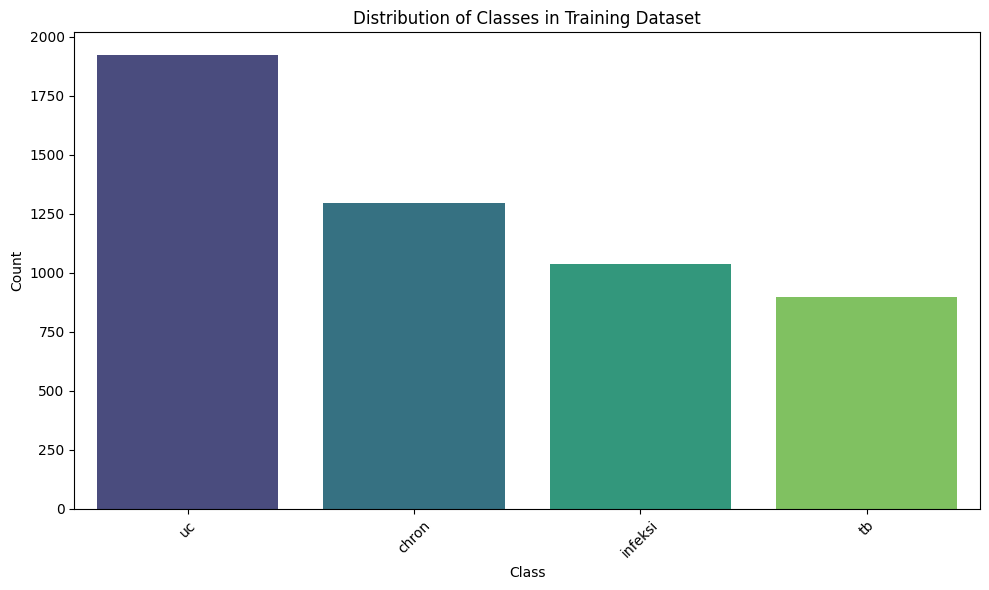

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(data=train_filenames_df, x='class', order=train_filenames_df['class'].value_counts().index, palette='viridis')

plt.title('Distribution of Classes in Training Dataset')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


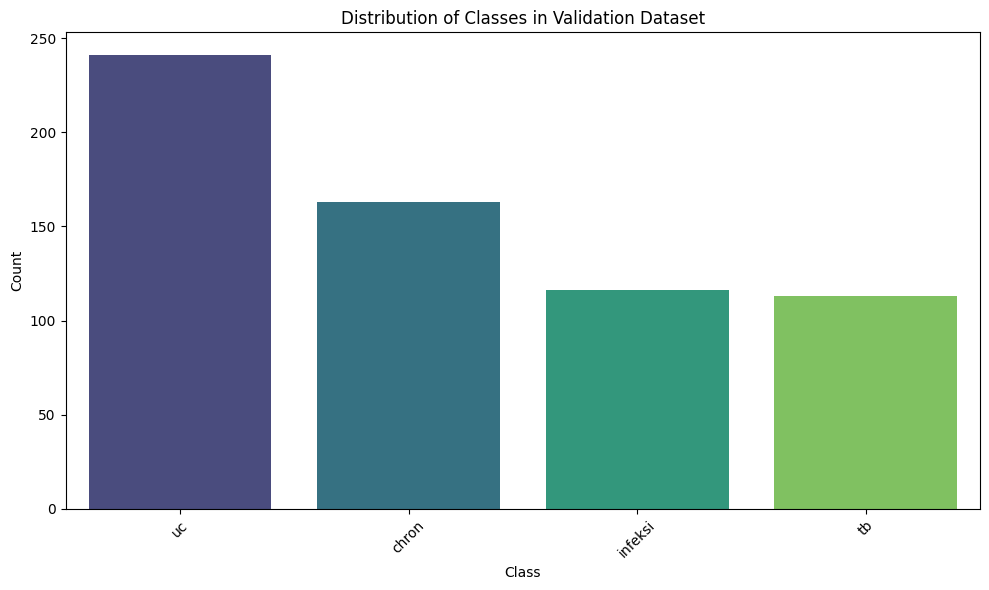

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(data=val_filenames_df, x='class', order=val_filenames_df['class'].value_counts().index, palette='viridis')
plt.title('Distribution of Classes in Validation Dataset')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Pre Processor

In [18]:
from src.preprocessing import preprocess

target_input_size = tuple(PREPROCESSING_PARAMS['INPUT_SIZE'])
train_transform = preprocess(
    target_input_size=target_input_size,
    rotation_range=PREPROCESSING_PARAMS['ROTATION_RANGE'],
    width_shift_range=PREPROCESSING_PARAMS['WIDTH_SHIFT_RANGE'],
    height_shift_range=PREPROCESSING_PARAMS['HEIGHT_SHIFT_RANGE'],
    brightness_range=PREPROCESSING_PARAMS['BRIGHTNESS_RANGE'],
    zoom_range=PREPROCESSING_PARAMS['ZOOM_RANGE'],
    horizontal_flip=PREPROCESSING_PARAMS['HORIZONTAL_FLIP'],
    vertical_flip=PREPROCESSING_PARAMS['VERTICAL_FLIP'],
    channel_shift_range=PREPROCESSING_PARAMS['CHANNEL_SHIFT_RANGE'],
    fill_mode=PREPROCESSING_PARAMS['FILL_MODE'],
    shear_range=PREPROCESSING_PARAMS['SHEAR_RANGE']
    )

val_transform = preprocess(target_input_size=target_input_size) # only rescaling

In [19]:
from src.dataset import Dataset

train_dataset = Dataset(dataframe=train_filenames_df, 
                        categories=DATASET_PARAMS['CATEGORIES'],
                        transform=train_transform, 
                        seed=42, 
                        shuffle=False)

val_dataset = Dataset(dataframe=val_filenames_df, 
                      categories=DATASET_PARAMS['CATEGORIES'],
                      transform=val_transform, 
                      seed=42, 
                      shuffle=False)

test_dataset = Dataset(dataframe=test_filenames_df, 
                      categories=DATASET_PARAMS['CATEGORIES'],
                      transform=val_transform, 
                      seed=42, 
                      shuffle=False)

## Train loader

In [20]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, 
                          batch_size=TRAINING_PARAMS['BATCH_SIZE'], 
                          shuffle=False, 
                          num_workers=TRAINING_PARAMS['NUM_WORKERS'])

val_loader = DataLoader(val_dataset, 
                          batch_size=TRAINING_PARAMS['BATCH_SIZE'], 
                          shuffle=False, 
                          num_workers=TRAINING_PARAMS['NUM_WORKERS'])

#if test_dataset exist
if test_dataset:
    test_loader = DataLoader(test_dataset, 
                             batch_size=TRAINING_PARAMS['BATCH_SIZE'], 
                             shuffle=False, 
                             num_workers=TRAINING_PARAMS['NUM_WORKERS'])

### Inpect train data augmentation

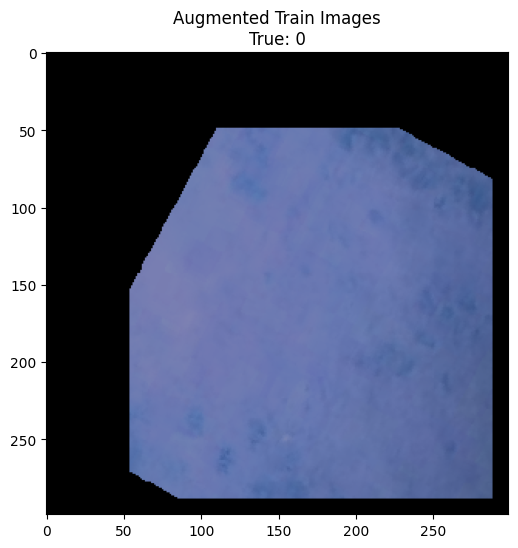

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
data, target = next(iter(train_loader))

img = data[random.randint(0, len(data) -1)].cpu().numpy()
img = np.transpose(img, (1, 2, 0))
img = img*255
plt.figure(figsize=(10, 6))
plt.title(f"Augmented Train Images\nTrue: {torch.argmax(target[random.randint(0, len(data) -1)], dim=0).item()}")
plt.imshow(img)
plt.show()

# Model

In [22]:
num_classes = len(categories)

### EfficientCapsNet

In [23]:
if MODEL_NAME == "CAPSNET":
    from src.model import EfficientCapsNet
    from src.loss import MarginLoss, marginLoss

    model = EfficientCapsNet(input_size=(MODEL_PARAMS['INPUT_SIZE']))
    loss = MarginLoss()
    # loss = marginLoss

### DenseNet

In [24]:
if MODEL_NAME == "DENSENET121":
    from src.densenet import DenseNet121
    from torch.nn import CrossEntropyLoss

    model = DenseNet121(num_classes=num_classes, dropout_rate=MODEL_PARAMS['DROPOUT_RATE'])
    loss = CrossEntropyLoss()   

# ResNet

In [25]:
if MODEL_NAME == "RESNET50":
    from src.resnet import ResNet50
    from torch.nn import CrossEntropyLoss

    model = ResNet50(num_classes=num_classes, dropout_rate=MODEL_PARAMS['DROPOUT_RATE'])
    loss = CrossEntropyLoss()   

In [26]:
# Check number of parameters
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# Get number of trainable parameters
number_of_parameters = count_parameters(model)

# Convert to string for printing
number_of_parameters_str = f"{number_of_parameters:,}"

print(f"Number of trainable parameters: {number_of_parameters_str}")

Number of trainable parameters: 8,310,636


# Training

## Metrics

In [27]:
# Optimizer
from torch.optim import AdamW

optimizer = AdamW(model.parameters(), lr=TRAINING_PARAMS['LEARNING_RATE'])

# use torcheval metrics
# metrics
from torcheval.metrics import (
    MulticlassAccuracy,
    MulticlassF1Score,
    MulticlassPrecision,
    MulticlassAUROC,
    MulticlassAUPRC,
    MulticlassRecall    
)

# Metrics
from src.metrics import (
    MulticlassMCC,
    MulticlassSpecificity
)

metrics = {
    "mcc": MulticlassMCC(num_classes=num_classes, device=DEVICE),
    "auprc": MulticlassAUPRC(num_classes=num_classes, average= TRAINING_PARAMS['AVERAGE'], device=DEVICE),
    "auroc": MulticlassAUROC(num_classes=num_classes, average= TRAINING_PARAMS['AVERAGE'], device=DEVICE),
    "accuracy": MulticlassAccuracy(num_classes=num_classes, average= TRAINING_PARAMS['AVERAGE'], device=DEVICE),
    "f1_score": MulticlassF1Score(num_classes=num_classes, average= TRAINING_PARAMS['AVERAGE'], device=DEVICE),
    "precision": MulticlassPrecision(num_classes=num_classes, average=TRAINING_PARAMS['AVERAGE'], device = DEVICE),
    "recall": MulticlassRecall(num_classes=num_classes, average=TRAINING_PARAMS['AVERAGE'], device = DEVICE),
    "specificity": MulticlassSpecificity(num_classes=num_classes, average=TRAINING_PARAMS['AVERAGE'], device = DEVICE)
}

In [ ]:
from src.train import train

history = train(model=model, 
    train_loader=train_loader, 
    val_loader=val_loader, 
    criterion=loss, 
    optimizer=optimizer, 
    num_epochs=TRAINING_PARAMS['NUM_EPOCHS'], 
    device=DEVICE,
    metrics=metrics,
    print_every=TRAINING_PARAMS['PRINT_EVERY'],
    save_patience=TRAINING_PARAMS['SAVE_PATIENCE'],
    save_path=TRAINING_PARAMS['SAVE_PATH'],
    save_model=TRAINING_PARAMS['SAVE_MODEL'],
    save_metrics=TRAINING_PARAMS['SAVE_METRICS']
    )

Training...


Epochs:   0%|          | 0/20 [00:00<?, ?it/s]

In [24]:
import json

with open("artifacts/uc_infeksi_chron_tb/densenet121/training_history.json", "r") as f:
    history = json.load(f)

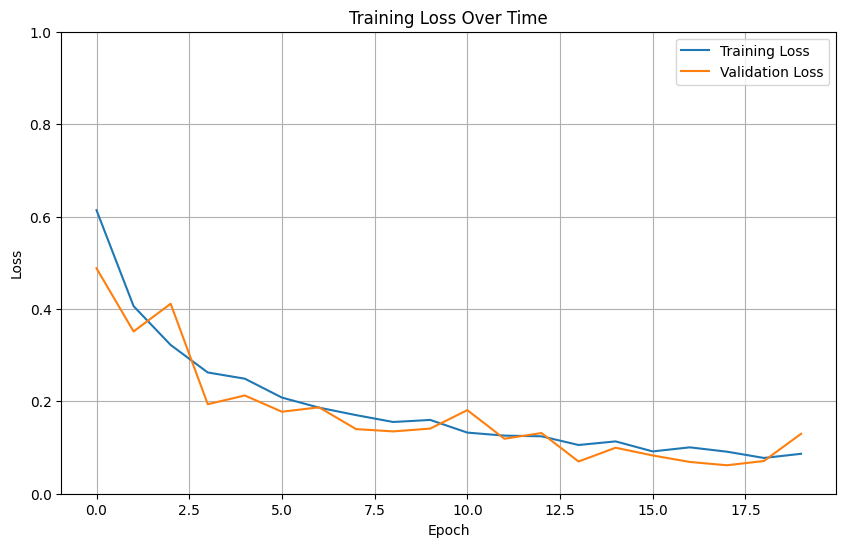

In [25]:
import matplotlib.pyplot as plt

train_loss = history["train_loss"]
val_loss = history["val_loss"]
plt.figure(figsize=(10, 6))
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training Loss Over Time')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.ylim(0, 1)
plt.legend()
plt.grid(True)
plt.show()


# Test

using validation data

## Initialization

In [19]:
from src.utils import load_model

# model = load_model("artifacts/resnet50/epoch_15.pth", num_classes=num_classes, dropout_rate=MODEL_PARAMS['DROPOUT_RATE'])
# model = load_model("artifacts/densenet121/epoch_10.pth", num_classes=2, dropout_rate=0.25)

model.load_state_dict(torch.load("artifacts/uc_infeksi_chron_tb/densenet121/epoch_18.pth", map_location=DEVICE))
model = model.to(DEVICE)

In [20]:
num_classes = len(categories)
# metrics
from torcheval.metrics import (
    MulticlassAccuracy,
    MulticlassF1Score,
    MulticlassPrecision,
    MulticlassAUROC,
    MulticlassAUPRC,
    MulticlassRecall    
)

# Metrics
from src.metrics import (
    MulticlassMCC,
    MulticlassSpecificity
)

test_metrics = {
    "mcc": MulticlassMCC(num_classes=num_classes, device=DEVICE),
    "auprc": MulticlassAUPRC(num_classes=num_classes, average= TRAINING_PARAMS['AVERAGE'], device=DEVICE),
    "auroc": MulticlassAUROC(num_classes=num_classes, average= TRAINING_PARAMS['AVERAGE'], device=DEVICE),
    "accuracy": MulticlassAccuracy(num_classes=num_classes, average= TRAINING_PARAMS['AVERAGE'], device=DEVICE),
    "f1_score": MulticlassF1Score(num_classes=num_classes, average= TRAINING_PARAMS['AVERAGE'], device=DEVICE),
    "precision": MulticlassPrecision(num_classes=num_classes, average=TRAINING_PARAMS['AVERAGE'], device = DEVICE),
    "recall": MulticlassRecall(num_classes=num_classes, average=TRAINING_PARAMS['AVERAGE'], device = DEVICE),
    "specificity": MulticlassSpecificity(num_classes=num_classes, average=TRAINING_PARAMS['AVERAGE'], device = DEVICE)
}

## Confussion Matrix

In [21]:
from src.test import test

raw_predictions, predicted_indices_flattened, target_indices_flattened, test_metrics = test(model = model, test_loader = test_loader, device = DEVICE, metrics=test_metrics)

Testing:   0%|          | 0/23 [00:00<?, ?it/s]

Testing: 100%|██████████| 23/23 [00:03<00:00,  6.01it/s]


In [22]:
test_metrics

{'mcc': 0.9824343323707581,
 'auprc': 0.9923004508018494,
 'auroc': 0.9982237219810486,
 'accuracy': 0.9828289151191711,
 'f1_score': 0.9815233945846558,
 'precision': 0.9802587032318115,
 'recall': 0.9828289151191711,
 'specificity': 0.9962286949157715}

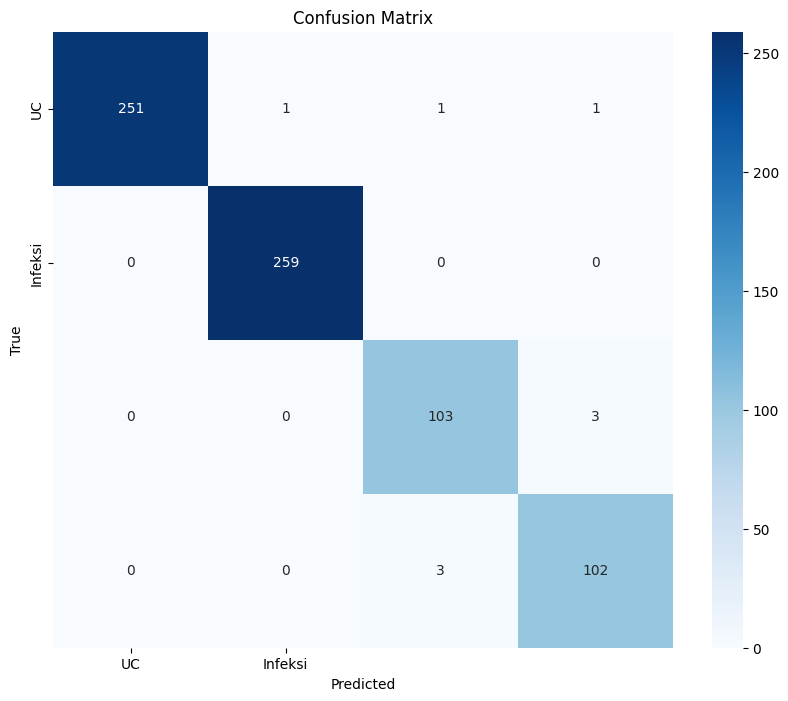

In [23]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


# Calculate confusion matrix
cm = confusion_matrix(target_indices_flattened, predicted_indices_flattened)

# Create figure and axis
plt.figure(figsize=(10, 8))

# Create heatmap
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['UC', 'Infeksi'],
            yticklabels=['UC', 'Infeksi'])

# Add labels and title
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')

# Show plot
plt.show()


## Test Metrics

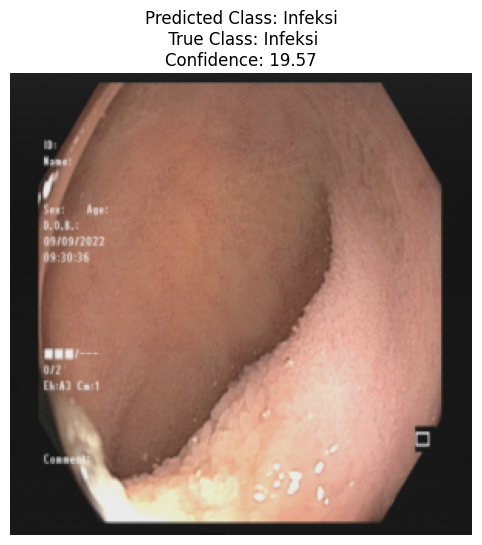

True class: Infeksi
Predicted class: Infeksi


In [34]:
sample_image, sample_target = test_dataset[2]
sample_image = sample_image.unsqueeze(0).to(DEVICE)

with torch.no_grad():
    prediction = model(sample_image)
    predicted_class = torch.argmax(prediction, dim=1).item()

sample_image_np = sample_image.squeeze().cpu().numpy()
sample_image_np = np.transpose(sample_image_np, (1, 2, 0))
sample_image_np = sample_image_np*255
plt.figure(figsize=(8, 6))
plt.imshow(sample_image_np)
plt.title(f'Predicted Class: {"UC" if predicted_class == 0 else "Infeksi"}\n True Class: {"UC" if torch.argmax(sample_target).item() == 0 else "Infeksi"}\nConfidence: {torch.max(prediction).item():.2f}')
plt.axis('off')
plt.show()

print(f"True class: {'UC' if torch.argmax(sample_target).item() == 0 else 'Infeksi'}")
print(f"Predicted class: {'UC' if predicted_class == 0 else 'Infeksi'}")

# XDL

## GradCAM

In [ ]:
import sys

# Delete "src.xdl" from sys.modules to avoid circular import issues
if "src.xdl" in sys.modules:
    del sys.modules["src.xdl"]

In [ ]:
import sys

# Delete "src.xdl" from sys.modules to avoid circular import issues
if "src.xdl" in sys.modules:
    del sys.modules["src.xdl"]

from src.xdl import plot_XDL_GradCAM


plot_XDL_GradCAM(model = model, 
                 test_loader = test_loader, 
                 device = DEVICE, 
                 print_img = True, 
                 num_samples = 100, 
                 save_path = False)

## Smoothgrad

In [ ]:
uc_train_len = len(train_filenames_df[train_filenames_df['class'] == 'uc'])
uc_val_len = len(val_filenames_df[val_filenames_df['class'] == 'uc'])
uc_test_len = len(test_filenames_df[test_filenames_df['class'] == 'uc'])

print(f"""UC (LIMUC+Changsu) train: {uc_train_len}
      \nUC (LIMUC+Changsu) val: {uc_val_len}
      \nUC (LIMUC+Changsu) test: {uc_test_len}
      \nTotal: {uc_train_len + uc_val_len + uc_test_len}""")

In [ ]:
from src.xdl import plot_XDL_SmoothGrad

plot_XDL_SmoothGrad(model, 
                    test_loader, 
                    n_samples_smoothgrad=150,
                    noise_level=0.1,
                    device=DEVICE, 
                    num_samples=len(test_loader.dataset.dataframe), 
                    print_img=False, 
                    print_every=10, 
                    save_path="outputs/smoothgrad/limuc_cropped_novasir_2",
                    smoothgrad_percentile=97,
                    smoothgrad_colormap='viridis',
                    smoothgrad_overlay_alpha=0.4,
                    fontsize=14)

In [ ]:
from src.xdl import plot_XDL_SmoothGrad

plot_XDL_SmoothGrad(model, 
                    test_loader, 
                    n_samples_smoothgrad=150,
                    noise_level=0.1,
                    device=DEVICE, 
                    num_samples=5, 
                    print_img=True, 
                    print_every=10, 
                    save_path=False,
                    smoothgrad_percentile=91,
                    smoothgrad_colormap='viridis',
                    smoothgrad_overlay_alpha=0.6,
                    fontsize=14)

In [ ]:
from src.xdl import plot_XDL_SmoothGrad

plot_XDL_SmoothGrad(model, 
                    test_loader, 
                    n_samples_smoothgrad=150,
                    noise_level=0.1,
                    device=DEVICE, 
                    num_samples=5, 
                    print_img=True, 
                    print_every=10, 
                    save_path=False,
                    smoothgrad_percentile=98,
                    smoothgrad_colormap='hot',
                    smoothgrad_overlay_alpha=0.3)

## GradCAM + Smoothgrad

In [39]:
import sys

# Delete "src.xdl" from sys.modules to avoid circular import issues
if "src.xdl" in sys.modules:
    del sys.modules["src.xdl"]

Using model: DenseNet121
Processing batch 1, samples processed: 0
Processed 0 samples
Processing batch 2, samples processed: 0
Processing sample 1, raw prediction: [ -8.973659  -10.223529    8.5690155  -0.7776495], predicted index: 2, true index: 2


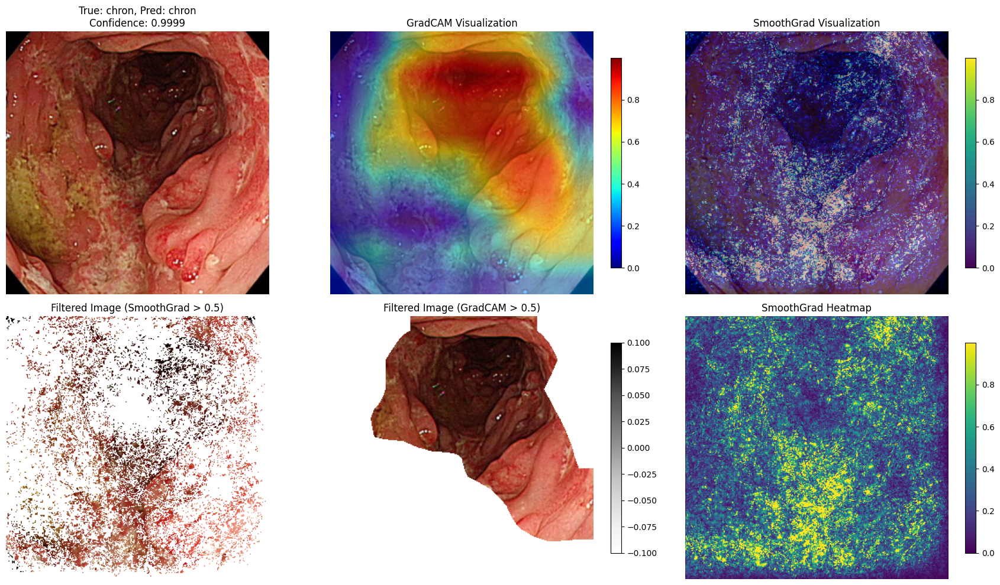

Processing batch 3, samples processed: 1
Processing batch 4, samples processed: 1
Processing sample 2, raw prediction: [-9.052688  -7.52895    9.490444  -2.8542788], predicted index: 2, true index: 2


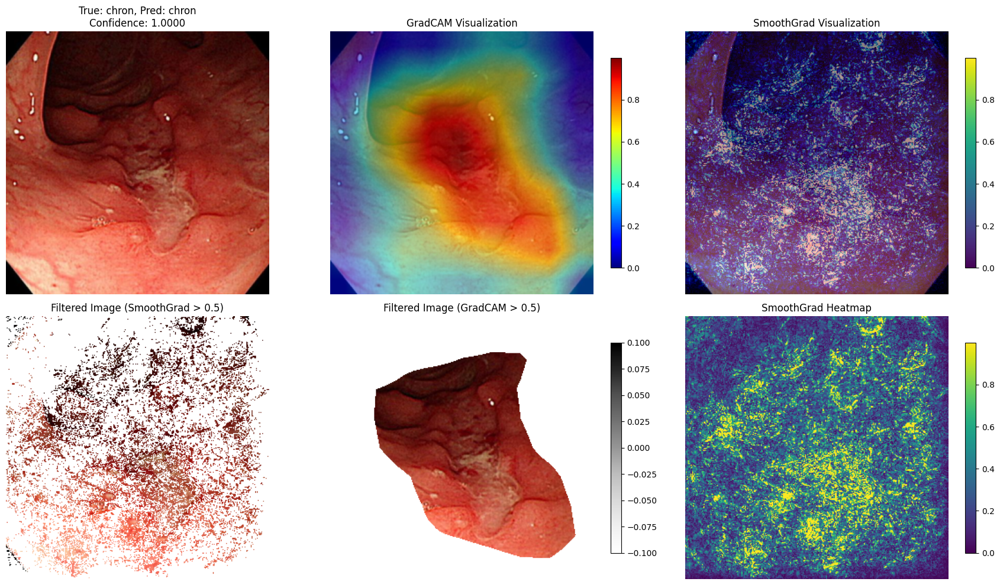

Processing sample 3, raw prediction: [-10.89599   -12.615551    5.3735957   6.8988957], predicted index: 3, true index: 3


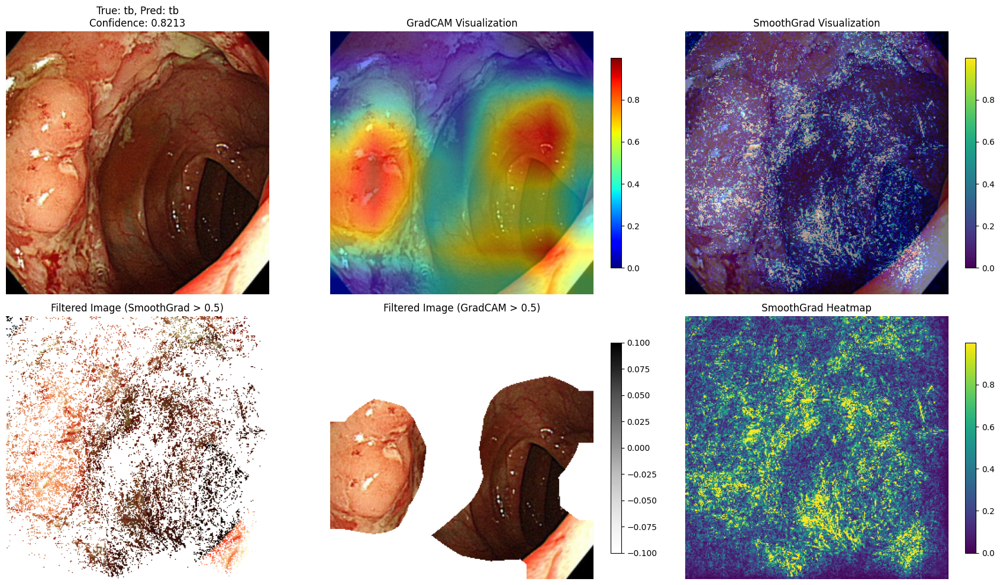

Processing batch 5, samples processed: 3
Processing batch 6, samples processed: 3
Processed 3 samples
Processing batch 7, samples processed: 3
Processing sample 4, raw prediction: [-10.984429    -5.3100348    5.918689     0.17281832], predicted index: 2, true index: 2


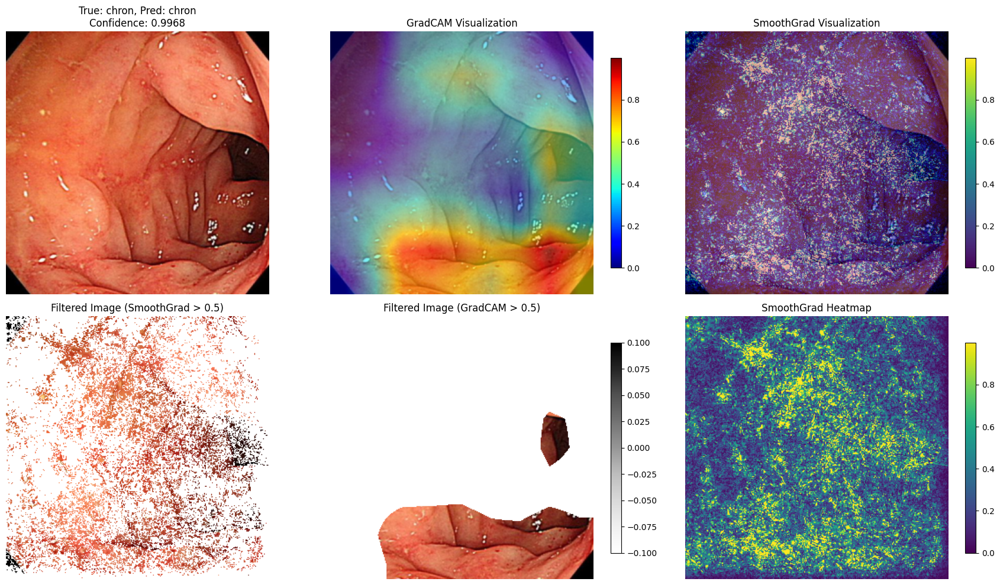

Processing batch 8, samples processed: 4
Processing batch 9, samples processed: 4
Processing batch 10, samples processed: 4
Processing batch 11, samples processed: 4
Processing sample 5, raw prediction: [-12.590709   -8.540283    2.0411894   7.128205 ], predicted index: 3, true index: 2


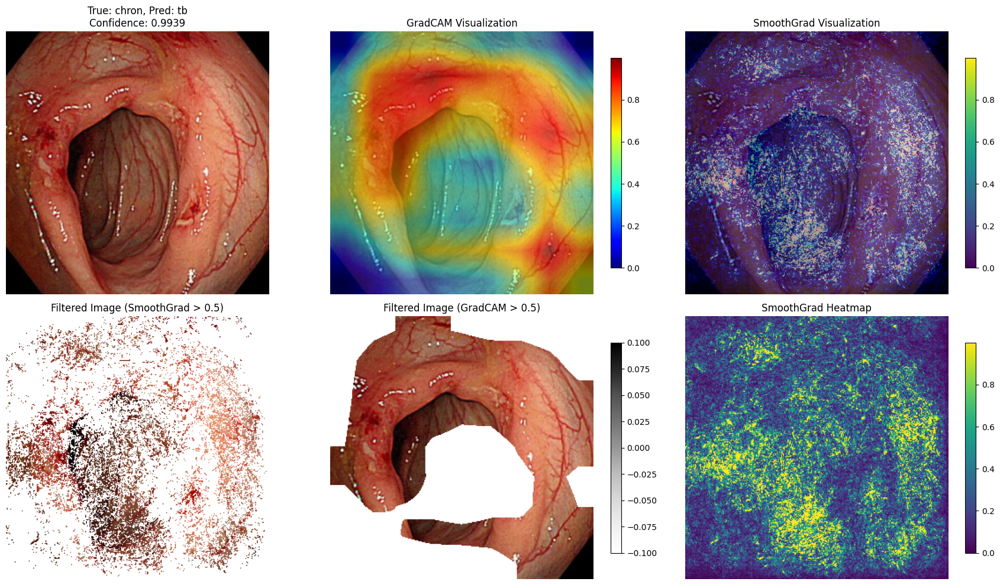

Processed 5 samples


In [ ]:
from src.xdl import plot_XDL_Visualizations

plot_XDL_Visualizations(model, 
                        test_loader, 
                        device=DEVICE, 
                        num_samples=300, 
                        print_img=True, 
                        print_every=5, 
                        save_path="outputs/xdl/uc_infeksi_chron_tb",)